<a href="https://colab.research.google.com/github/tmone/amr-system/blob/main/%5BSM%5D_Blood_Cell_Detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Blood Cell Recognition using AI: Technical Demonstration**

> 👥 StepMedia Sofware Dev Team



## Project Objectives
1. Demonstrate an automated system for blood cell recognition and classification
2. Showcase the accuracy and efficiency of our AI-powered solution
3. Present real-world applications and benefits in medical diagnostics

## Technical Demo

### I. Introduction: Blood cell analysis in medical diagnostics is a fundamental medical laboratory procedure that plays a crucial role in healthcare.

1. Key Components of Blood Cell Analysis:
- Complete Blood Count (CBC): Measures different types of blood cells:
- Red Blood Cells (RBCs/Erythrocytes): Carry oxygen throughout the body
- White Blood Cells (WBCs/Leukocytes): Fight infections and diseases
- Platelets (Thrombocytes): Help in blood clotting

2. Traditional Analysis Methods:
- Manual Microscopy: Laboratory technicians examine blood smears under microscopes
- Flow Cytometry: Automated analysis of cell populations
- Hematology Analyzers: Automated cell counting and classification

3. Clinical Significance:
- Disease Detection: Identifying conditions like anemia, infections, and leukemia
- Monitoring Treatment: Tracking patient response to various therapies
- Preventive Care: Regular health screenings and early disease detection
- Pre-surgical Assessment: Evaluating patient fitness for procedures

4. Key Parameters Analyzed:
- Cell Counts: Quantitative measurement of each cell type
- Morphology: Cell shape, size, and structural abnormalities
- Distribution: Proportion of different cell types
- Cell Maturity: Identifying immature or abnormal cells

## II. Dataset and Preprocessing:
- Dataset quality is crucial for the success of AI blood cell recognition demos. High-quality datasets lead to accurate models, reduced training time, and increased reliability during demonstrations. However, selecting appropriate datasets presents significant challenges: online datasets often lack source information, have inconsistent quality, and insufficient validation. This requires development teams to spend time on validation, prepare multiple backup scenarios, and maintain transparency about model limitations with clients
- We have carefully selected datasets from reputable sources that have been extensively validated by the research community and are licensed for research and model development. These datasets have been peer-reviewed, widely cited in academic publications, and are specifically permitted for AI training and demonstration purposes.
- [BloodCell yolo format](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)

In [7]:
import kagglehub
bcd_datatset_path = kagglehub.dataset_download('quangnguynvnnn/bloodcell-yolo-format')

print('Data source import complete.')


Data source import complete.


### Dataset structure

In [8]:
import os
from pathlib import Path
import pandas as pd
from IPython.display import display, HTML

def display_yolo_structure(dataset_path):
    """
    Display the structure of a YOLO dataset including train/val/test splits,
    image counts, and label statistics.

    Args:
        dataset_path (str): Root path to the YOLO dataset
    """
    # Convert to Path object for easier handling
    root = Path(dataset_path)

    print("📁 YOLO Dataset Structure Analysis\n")

    # Initialize counters
    total_images = 0
    total_labels = 0
    splits_info = {}

    # Expected YOLO structure
    expected_dirs = ['train', 'valid', 'test']

    for split in expected_dirs:
        split_path = root / split
        if not split_path.exists():
            continue

        # Count images
        image_path = split_path / 'images'
        images = list(image_path.glob('*.jpg')) + list(image_path.glob('*.png'))
        num_images = len(images)

        # Count labels
        label_path = split_path / 'labels'
        labels = list(label_path.glob('*.txt'))
        num_labels = len(labels)

        splits_info[split] = {
            'images': num_images,
            'labels': num_labels
        }

        total_images += num_images
        total_labels += num_labels

    # Create a DataFrame for better visualization
    df = pd.DataFrame.from_dict(splits_info, orient='index')

    # Display summary
    print(f"Dataset Location: {root}\n")
    print("📊 Dataset Statistics:")
    print(f"Total Images: {total_images}")
    print(f"Total Labels: {total_labels}\n")

    print("📂 Split Distribution:")
    display(df.style.set_caption("Dataset Split Statistics")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

    # Check dataset structure
    print("\n✔️ Dataset Structure Validation:")
    for split in expected_dirs:
        if (root / split).exists():
            print(f"\n{split}:")
            print(f"  ├── images/")
            print(f"  └── labels/")

            # Sample a few image names
            sample_images = list((root / split / 'images').glob('*.jpg'))[:3]
            if sample_images:
                print(f"      Sample images:")
                for img in sample_images:
                    print(f"      ├── {img.name}")

def analyze_yolo_labels(dataset_path, num_classes):
    """
    Analyze YOLO label distribution across classes

    Args:
        dataset_path (str): Root path to the YOLO dataset
        num_classes (int): Number of classes in the dataset
    """
    root = Path(dataset_path)
    class_counts = {i: 0 for i in range(num_classes)}

    print("\n📊 Label Distribution Analysis:")

    for split in ['train', 'valid', 'test']:
        label_path = root / split / 'labels'
        if not label_path.exists():
            continue

        for label_file in label_path.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    class_id = int(line.split()[0])
                    class_counts[class_id] += 1

    # Create DataFrame for visualization
    df = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count'])
    df.index.name = 'Class ID'

    display(df.style.set_caption("Class Distribution")
            .format("{:,}")
            .background_gradient(cmap='Blues'))

# Example usage:
# display_yolo_structure('/content/dataset')
# analyze_yolo_labels('/content/dataset', num_classes=5)

In [9]:
display_yolo_structure(bcd_datatset_path)

📁 YOLO Dataset Structure Analysis

Dataset Location: /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1

📊 Dataset Statistics:
Total Images: 7950
Total Labels: 7950

📂 Split Distribution:


,images,labels
train,"6,000","6,000"
valid,"1,000","1,000"
test,950,950



✔️ Dataset Structure Validation:

train:
  ├── images/
  └── labels/
      Sample images:
      ├── BA_434177_jpg_jpg.rf.2851d27609fc272a0b512e336697a2e1.jpg
      ├── MO_689697_jpg_jpg.rf.1959eaac64a6c9957bc1d1715cf58a94.jpg
      ├── PLATELET_240431_jpg_jpg.rf.b8dcbcb58d00db8ccf39d87a3b34e9d2.jpg

valid:
  ├── images/
  └── labels/
      Sample images:
      ├── PLATELET_624944_jpg_jpg.rf.fef39a6cae397d82379528ff74571a63.jpg
      ├── EO_174410_jpg_jpg.rf.54e1987752a5025ab3980c7069268958.jpg
      ├── EO_446061_jpg_jpg.rf.ce418481907841b3229469e38169609d.jpg

test:
  ├── images/
  └── labels/
      Sample images:
      ├── BNE_269921_jpg_jpg.rf.98a44df9e4c1ce8f267fd5436c3e5b90.jpg
      ├── BNE_78683_jpg_jpg.rf.23e7808ad1fb8aa770e7dc3a363d4a2b.jpg
      ├── BA_849105_jpg_jpg.rf.590901b52d3398abbbb24066dcbb00c1.jpg


### Introduction to the blood cell image dataset

In [10]:
from glob import glob
import os

HOME = "/kaggle/working"
def make_ds(root, path_to_copy):

    os.makedirs(path_to_copy, exist_ok = True)

    files = glob(f"{root}/*")
    for idx, file in enumerate(files):
        if os.path.isdir(file): os.system(f"cp -r '{file}' {path_to_copy}")
        elif os.path.isfile(file): os.system(f"cp '{file}' {path_to_copy}")

root = "/kaggle/input/blood-cell-detection-datatset"
make_ds(root = root, path_to_copy = f"{HOME}/datasets")

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-11-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-11-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
<ipython-input-11-a9a811b311b3>:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


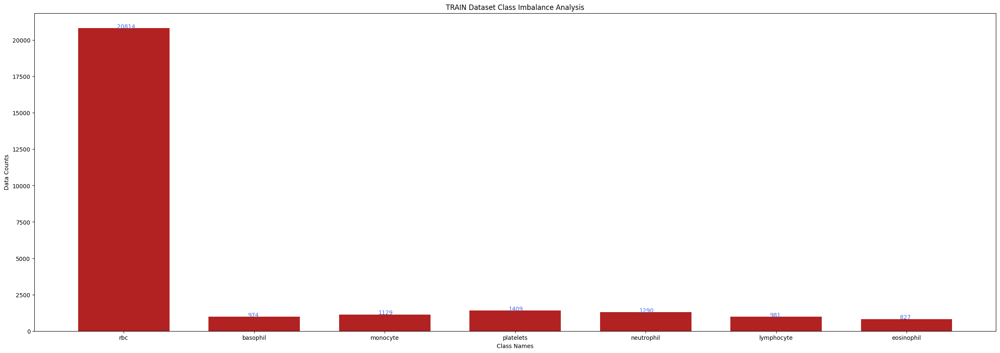

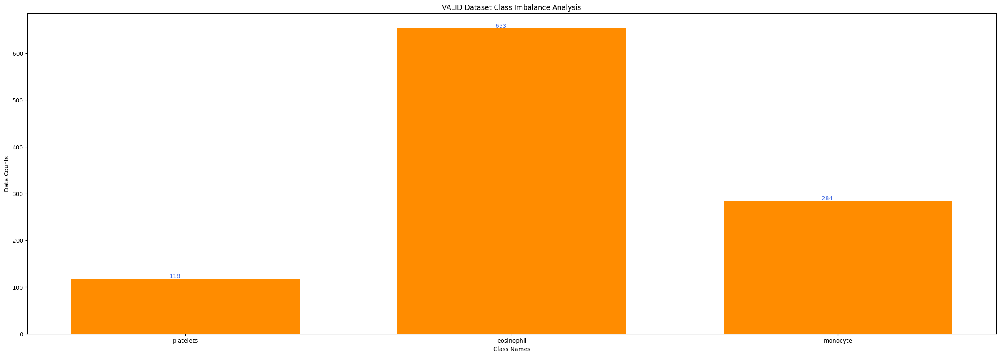

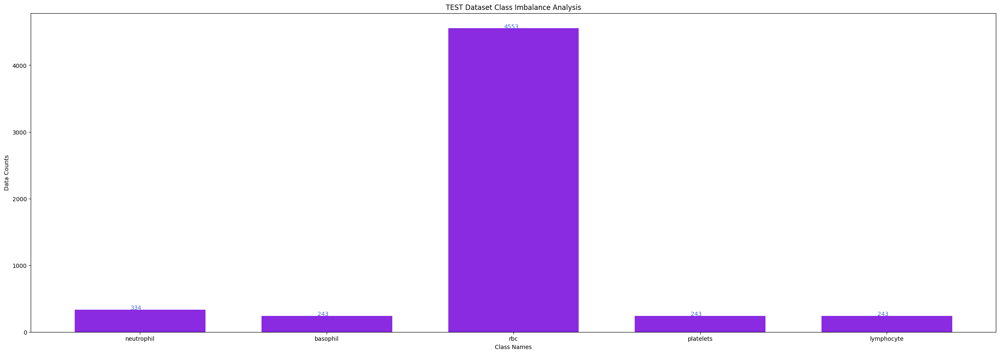

In [11]:
import cv2, yaml, random, numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names(); self.get_bboxes()

    def get_cls_names(self):

        with open(f"{bcd_datatset_path}/data.yaml", 'r') as file: data = yaml.safe_load(file)
        # Extract class names
        class_names = data['names']

        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}

    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{bcd_datatset_path}/{data_type}/images/*")
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # if idx == 3: break
                lbl_path  = im_path.replace("images", "labels").replace(".jpg", ".txt")
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    # Split the string by space and strip the newline character
                    # Change here
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):

        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:

            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There are {len(bboxes)} objects in the image.")

        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1

        plt.figure(figsize = (25, 20))

        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):

            if count == self.n_ims + 1: break

            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)

        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

    def visualization(self): [self.vis(save_name) for save_name in self.data_types]

    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

vis = Visualization(data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

TRAIN Data Visualization is in process...



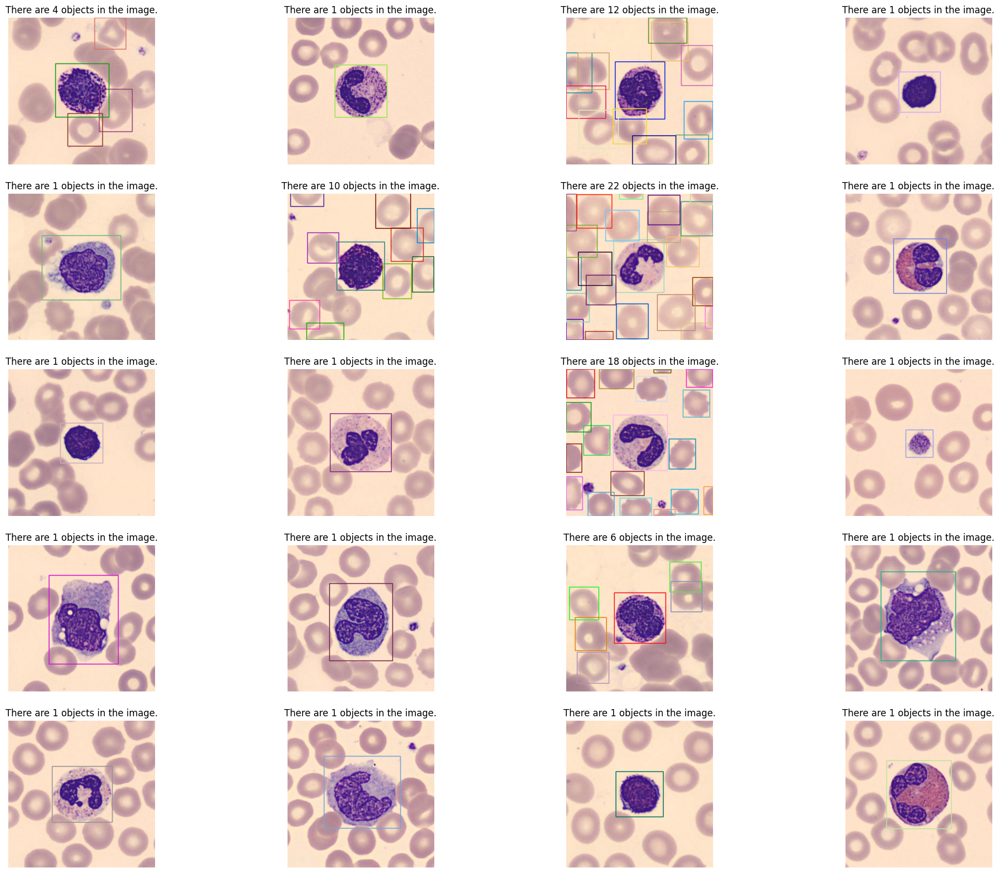

VALID Data Visualization is in process...



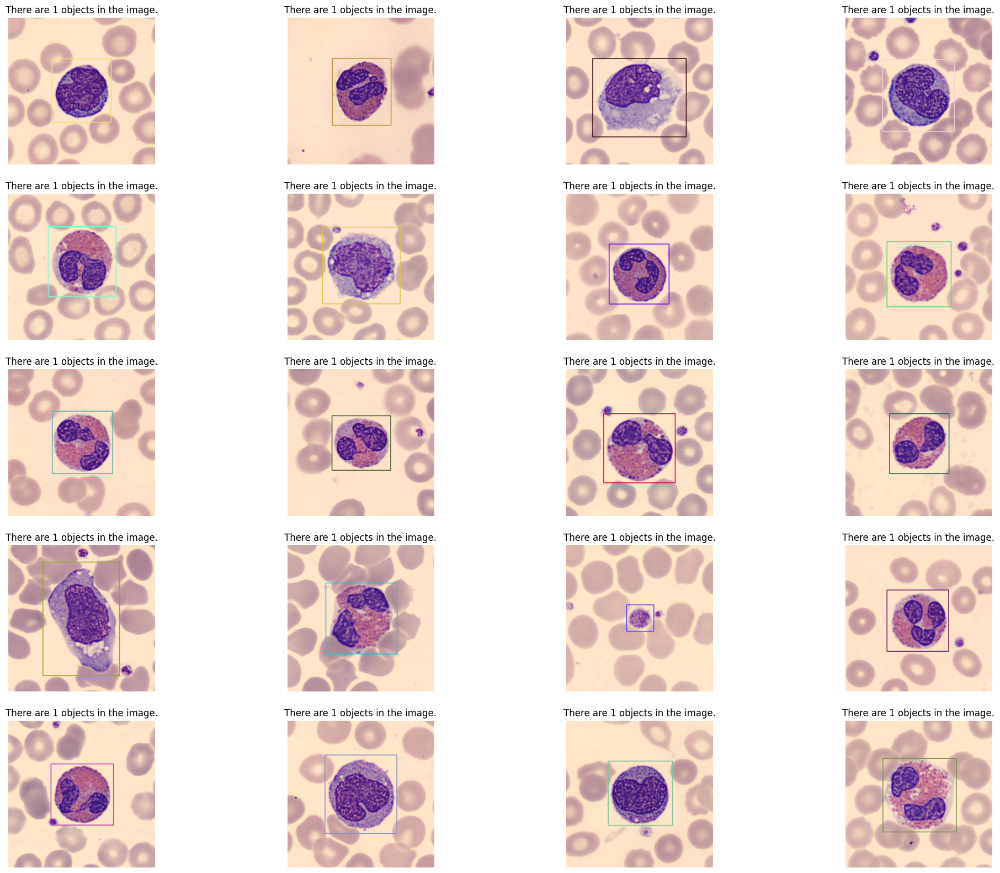

TEST Data Visualization is in process...



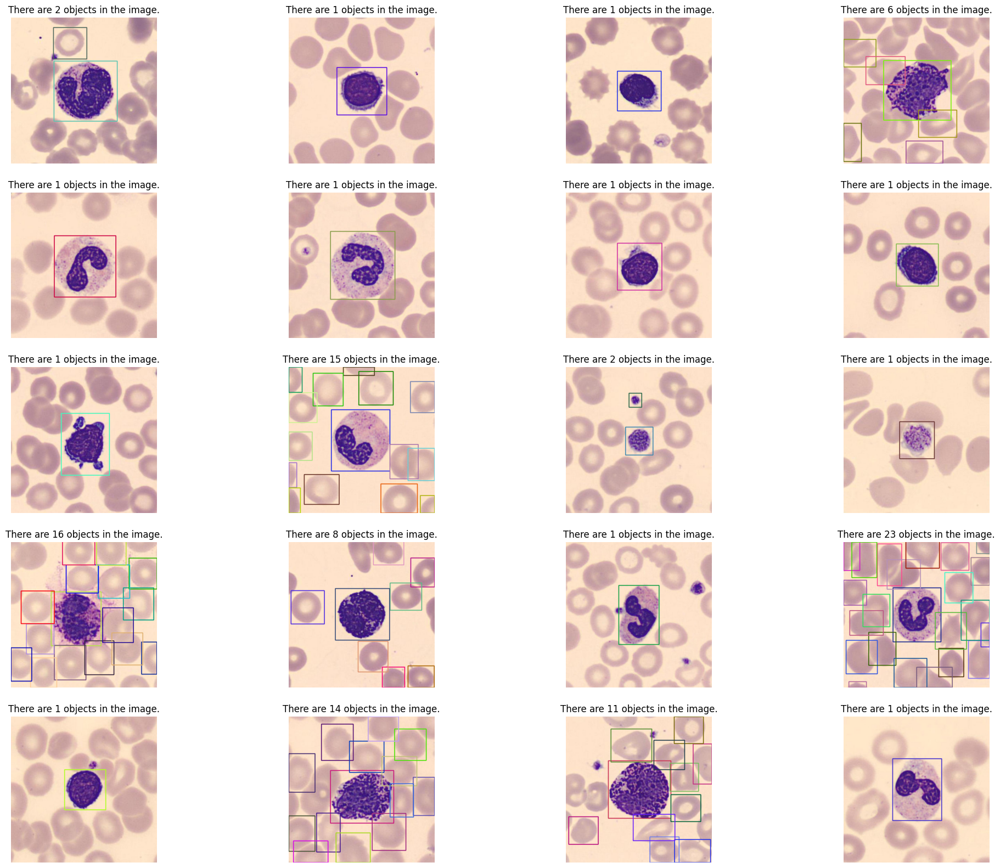

In [12]:
vis.visualization()

## III. Required Libraries and Dependencies
- Ultralytics YOLOv11: Latest version of the YOLO family, offering state-of-the-art performance for object detection

In [13]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

## IV. Training process overview

- Google Colab Pro with A100 GPU for training 6000 images on train datasets (About 2-3 Hours to completed)

In [19]:
train_results = model.train(
    data=f"{bcd_datatset_path}/data.yaml",  # path to dataset YAML
    epochs=100,  # number of training epochs
    imgsz=480,  # training image size
    device=0,  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
    patience=50,
    save=True,
    exist_ok=True,
    pretrained=True,
    lr0=0.001,
    weight_decay=0.0005,
    warmup_epochs=3,
    close_mosaic=10,
    augment=True,
    save_period=10,
    verbose=True,
    # These settings will push GPU usage higher
    batch=32,            # Increase batch size significantly
    workers=16,          # More workers for data loading
    cache=True,          # Cache images in RAM
    # Training parameters
    # Augmentation (reduce if causing bottleneck)
    mosaic=0.0,         # Disable mosaic if causing CPU bottleneck
    mixup=0.0,          # Disable mixup if causing CPU bottleneck
    # Optimization
    amp=True,           # Automatic mixed precision
    optimizer='AdamW',
    cos_lr=True,
)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/data.yaml, epochs=100, time=None, patience=50, batch=32, imgsz=480, save=True, save_period=10, cache=True, device=0, workers=16, project=None, name=train, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_co

train: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/train/labels.cache... 6000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6000/6000 [00:00<?, ?it/s]

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.



train: Caching images (3.9GB RAM): 100%|██████████| 6000/6000 [00:03<00:00, 1527.74it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/valid/labels.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.6GB RAM): 100%|██████████| 1000/1000 [00:01<00:00, 722.05it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 12 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.96G     0.6568     0.7378     0.9546         37        480: 100%|██████████| 188/188 [00:25<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.59it/s]

                   all       1000       1055      0.955      0.903      0.976      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.98G     0.6678     0.7687     0.9563         58        480: 100%|██████████| 188/188 [00:24<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.955      0.927      0.975      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.97G     0.6647     0.7489     0.9589         99        480: 100%|██████████| 188/188 [00:23<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.67it/s]

                   all       1000       1055      0.825      0.848      0.891      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.98G     0.6689     0.7323     0.9569         33        480: 100%|██████████| 188/188 [00:22<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.881      0.868      0.982      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.94G      0.651     0.6861     0.9522         52        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.907      0.771      0.951      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.98G     0.6514     0.6889     0.9488        111        480: 100%|██████████| 188/188 [00:22<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]

                   all       1000       1055      0.932      0.947       0.97      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.98G     0.6374     0.6574     0.9435        102        480: 100%|██████████| 188/188 [00:22<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all       1000       1055      0.917      0.963      0.975      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.94G     0.6365     0.6457     0.9413         49        480: 100%|██████████| 188/188 [00:22<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.972      0.978      0.984      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.99G       0.63     0.6457     0.9396         61        480: 100%|██████████| 188/188 [00:23<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.78it/s]

                   all       1000       1055      0.983      0.981      0.989      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.97G     0.6316     0.6382     0.9388         42        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.973      0.971      0.991      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.94G     0.6198     0.6296     0.9351         35        480: 100%|██████████| 188/188 [00:22<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all       1000       1055      0.965      0.967      0.981      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.98G     0.6213      0.625     0.9334         28        480: 100%|██████████| 188/188 [00:22<00:00,  8.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.76it/s]

                   all       1000       1055      0.685      0.836      0.974      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.94G     0.6118     0.6333     0.9293         44        480: 100%|██████████| 188/188 [00:22<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055      0.975      0.974      0.989      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.94G     0.6109     0.6154     0.9307         35        480: 100%|██████████| 188/188 [00:22<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.968      0.986       0.99      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.94G      0.611     0.6044     0.9324         83        480: 100%|██████████| 188/188 [00:23<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all       1000       1055      0.981      0.987      0.991      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.98G     0.6041     0.6044     0.9299         31        480: 100%|██████████| 188/188 [00:22<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]

                   all       1000       1055      0.975      0.975      0.988      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.94G     0.6004      0.592     0.9258         44        480: 100%|██████████| 188/188 [00:23<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]

                   all       1000       1055      0.979      0.978      0.991      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.99G     0.5977     0.5845     0.9242         98        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055      0.973      0.983       0.99      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.94G     0.5991     0.6083     0.9213         47        480: 100%|██████████| 188/188 [00:23<00:00,  8.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]

                   all       1000       1055      0.975      0.982      0.992      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.94G     0.6011     0.5906     0.9216        109        480: 100%|██████████| 188/188 [00:22<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all       1000       1055      0.964       0.96      0.982      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.94G     0.5968     0.5865     0.9278         57        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]

                   all       1000       1055       0.98      0.984      0.993      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.97G     0.5927     0.5779     0.9204         43        480: 100%|██████████| 188/188 [00:22<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]

                   all       1000       1055      0.983      0.994      0.992      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.99G     0.5919     0.5716     0.9175         86        480: 100%|██████████| 188/188 [00:22<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]

                   all       1000       1055      0.978      0.991      0.992       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.93G     0.5872     0.5749     0.9154         60        480: 100%|██████████| 188/188 [00:22<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]

                   all       1000       1055      0.982      0.978      0.992       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.98G     0.5866     0.5727     0.9186         73        480: 100%|██████████| 188/188 [00:22<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]

                   all       1000       1055      0.977      0.983      0.991      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.94G     0.5873     0.5696     0.9195         86        480: 100%|██████████| 188/188 [00:22<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.985      0.965      0.991      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.98G     0.5841     0.5663     0.9191         63        480: 100%|██████████| 188/188 [00:22<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]

                   all       1000       1055      0.977      0.977      0.991      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.94G      0.585     0.5598     0.9202         77        480: 100%|██████████| 188/188 [00:22<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]

                   all       1000       1055      0.981      0.976      0.989       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.99G      0.576     0.5588     0.9149         65        480: 100%|██████████| 188/188 [00:23<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.78it/s]

                   all       1000       1055      0.953      0.939      0.991      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.94G     0.5761     0.5568     0.9135         63        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.973      0.985      0.991        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.93G     0.5811     0.5489     0.9161         76        480: 100%|██████████| 188/188 [00:22<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.981      0.969       0.99      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.98G     0.5791     0.5594     0.9103         65        480: 100%|██████████| 188/188 [00:23<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.977      0.963      0.992      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.94G     0.5775      0.547      0.913         90        480: 100%|██████████| 188/188 [00:23<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055       0.98      0.986      0.993      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.97G     0.5756     0.5511     0.9151         84        480: 100%|██████████| 188/188 [00:23<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]

                   all       1000       1055      0.982      0.963      0.992      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.94G       0.57     0.5489     0.9079         75        480: 100%|██████████| 188/188 [00:22<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]

                   all       1000       1055      0.985      0.987      0.993      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.97G     0.5719     0.5484     0.9135         57        480: 100%|██████████| 188/188 [00:23<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]

                   all       1000       1055      0.975      0.986      0.992      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.98G     0.5692     0.5376     0.9111         45        480: 100%|██████████| 188/188 [00:22<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]

                   all       1000       1055      0.987      0.984      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.93G     0.5669     0.5305     0.9114         58        480: 100%|██████████| 188/188 [00:23<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.982      0.984      0.992      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.97G     0.5669     0.5395     0.9121         99        480: 100%|██████████| 188/188 [00:22<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.71it/s]

                   all       1000       1055       0.98      0.991      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.98G     0.5623     0.5329     0.9077         47        480: 100%|██████████| 188/188 [00:23<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]

                   all       1000       1055      0.982      0.987      0.993      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.94G     0.5694     0.5304     0.9118         46        480: 100%|██████████| 188/188 [00:22<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.77it/s]

                   all       1000       1055      0.979      0.984      0.992      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.98G     0.5614     0.5387     0.9127         73        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]

                   all       1000       1055      0.981      0.992      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.99G     0.5625     0.5351     0.9056         85        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all       1000       1055      0.982      0.982      0.991      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.88G     0.5583     0.5302     0.9043         79        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]

                   all       1000       1055       0.98      0.978      0.992      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.99G     0.5583     0.5316      0.908         38        480: 100%|██████████| 188/188 [00:22<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]

                   all       1000       1055      0.982      0.987      0.993      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.99G     0.5588     0.5282     0.9056         96        480: 100%|██████████| 188/188 [00:22<00:00,  8.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]

                   all       1000       1055      0.974      0.989      0.992      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.98G     0.5566     0.5315     0.9085         65        480: 100%|██████████| 188/188 [00:22<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055      0.983      0.993      0.993      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.93G     0.5636     0.5267     0.9107         78        480: 100%|██████████| 188/188 [00:22<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]

                   all       1000       1055      0.982      0.981      0.992      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.98G     0.5581     0.5264     0.9052         62        480: 100%|██████████| 188/188 [00:22<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all       1000       1055      0.988      0.988      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.94G     0.5591     0.5262     0.9066         42        480: 100%|██████████| 188/188 [00:23<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.986      0.986      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.97G     0.5524     0.5168     0.9045         71        480: 100%|██████████| 188/188 [00:22<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]

                   all       1000       1055      0.989      0.984      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.97G     0.5573     0.5157      0.905         86        480: 100%|██████████| 188/188 [00:22<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.78it/s]

                   all       1000       1055      0.984      0.984      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.94G     0.5506     0.5142     0.9009         64        480: 100%|██████████| 188/188 [00:22<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055       0.98      0.987      0.993      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.88G       0.55     0.5128     0.9063        108        480: 100%|██████████| 188/188 [00:22<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.983      0.991      0.993      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.97G     0.5484     0.5016     0.9009         57        480: 100%|██████████| 188/188 [00:23<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]

                   all       1000       1055      0.987      0.982      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.98G     0.5482     0.5135      0.903         89        480: 100%|██████████| 188/188 [00:22<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]

                   all       1000       1055      0.981      0.987      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.89G     0.5473     0.5081     0.8983        125        480: 100%|██████████| 188/188 [00:23<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]

                   all       1000       1055       0.98       0.99      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.98G     0.5478     0.5031      0.901        123        480: 100%|██████████| 188/188 [00:22<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.982      0.987      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.97G     0.5426     0.4979     0.8987         77        480: 100%|██████████| 188/188 [00:23<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]

                   all       1000       1055      0.982      0.991      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.93G     0.5397     0.5003     0.8971         75        480: 100%|██████████| 188/188 [00:23<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]

                   all       1000       1055      0.983      0.986      0.993      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.94G     0.5452     0.5076     0.9021         49        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]

                   all       1000       1055      0.984      0.984      0.992      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.88G     0.5428     0.4954     0.9003         49        480: 100%|██████████| 188/188 [00:22<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all       1000       1055      0.989      0.986      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.98G     0.5418     0.5008     0.9007         64        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.85it/s]

                   all       1000       1055      0.988      0.986      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.94G     0.5399     0.5046     0.8988         44        480: 100%|██████████| 188/188 [00:22<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]

                   all       1000       1055      0.989      0.985      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.94G      0.538      0.491     0.8978         34        480: 100%|██████████| 188/188 [00:23<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.989      0.986      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.97G     0.5416     0.4882     0.9013         57        480: 100%|██████████| 188/188 [00:22<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]

                   all       1000       1055      0.986      0.988      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.98G     0.5332     0.4858     0.8984        104        480: 100%|██████████| 188/188 [00:23<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]

                   all       1000       1055      0.982      0.988      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.94G     0.5369     0.4913     0.9007         90        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]

                   all       1000       1055      0.986      0.986      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.98G     0.5355     0.4834     0.8996         84        480: 100%|██████████| 188/188 [00:22<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.986      0.987      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.97G     0.5326     0.4844      0.896         82        480: 100%|██████████| 188/188 [00:23<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]

                   all       1000       1055       0.99      0.983      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.97G     0.5333     0.4769     0.8959         82        480: 100%|██████████| 188/188 [00:22<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]

                   all       1000       1055      0.984       0.99      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.97G      0.532     0.4832     0.8969         78        480: 100%|██████████| 188/188 [00:23<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]

                   all       1000       1055      0.987      0.986      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.93G     0.5337     0.4806     0.8977         94        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]

                   all       1000       1055      0.987      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.94G     0.5303     0.4791     0.8967         57        480: 100%|██████████| 188/188 [00:23<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]

                   all       1000       1055      0.985       0.99      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.98G     0.5335     0.4804     0.8961         47        480: 100%|██████████| 188/188 [00:22<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]

                   all       1000       1055      0.992      0.986      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.93G     0.5272     0.4747     0.8925         57        480: 100%|██████████| 188/188 [00:23<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all       1000       1055      0.981      0.992      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.99G     0.5291     0.4746     0.8949         58        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]

                   all       1000       1055      0.985      0.992      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.94G     0.5304      0.466     0.8974         44        480: 100%|██████████| 188/188 [00:23<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.85it/s]

                   all       1000       1055       0.99      0.992      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.99G     0.5252     0.4767     0.8962         59        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]

                   all       1000       1055      0.988      0.992      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.93G     0.5275     0.4645      0.897         75        480: 100%|██████████| 188/188 [00:23<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]

                   all       1000       1055      0.986      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.97G     0.5265      0.464     0.8934         72        480: 100%|██████████| 188/188 [00:22<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]

                   all       1000       1055      0.992      0.983      0.994      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.97G     0.5215     0.4675      0.893         59        480: 100%|██████████| 188/188 [00:23<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]

                   all       1000       1055      0.983      0.992      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.94G     0.5248     0.4689     0.8961         68        480: 100%|██████████| 188/188 [00:23<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.77it/s]

                   all       1000       1055      0.987      0.986      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.89G     0.5252     0.4599     0.8941        107        480: 100%|██████████| 188/188 [00:23<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]

                   all       1000       1055      0.986      0.991      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.97G     0.5239     0.4641      0.892         69        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all       1000       1055      0.989      0.992      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.94G     0.5257     0.4593     0.8934         66        480: 100%|██████████| 188/188 [00:23<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]

                   all       1000       1055      0.985      0.991      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.97G     0.5206     0.4556     0.8936         42        480: 100%|██████████| 188/188 [00:22<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]

                   all       1000       1055      0.987      0.991      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.98G     0.5203     0.4522     0.8894         36        480: 100%|██████████| 188/188 [00:23<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]

                   all       1000       1055      0.987      0.991      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.94G     0.5224     0.4554     0.8953         66        480: 100%|██████████| 188/188 [00:22<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.988       0.99      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.94G     0.5246     0.4569     0.8937         43        480: 100%|██████████| 188/188 [00:23<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]

                   all       1000       1055      0.986       0.99      0.993      0.917


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.98G       0.52     0.4541     0.8877         58        480: 100%|██████████| 188/188 [00:24<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]

                   all       1000       1055      0.987       0.99      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.94G     0.5201     0.4494      0.894         72        480: 100%|██████████| 188/188 [00:22<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]

                   all       1000       1055      0.986       0.99      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.98G     0.5194     0.4513     0.8913         60        480: 100%|██████████| 188/188 [00:23<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.986       0.99      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.94G     0.5206     0.4508     0.8926         72        480: 100%|██████████| 188/188 [00:23<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]

                   all       1000       1055      0.987      0.988      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.98G     0.5184     0.4458     0.8895         88        480: 100%|██████████| 188/188 [00:23<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.96it/s]

                   all       1000       1055      0.987      0.989      0.993      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.97G     0.5203     0.4454     0.8931         55        480: 100%|██████████| 188/188 [00:22<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]

                   all       1000       1055      0.988      0.989      0.993      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.94G     0.5207     0.4485      0.892         59        480: 100%|██████████| 188/188 [00:23<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all       1000       1055      0.988      0.989      0.993      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.98G     0.5204       0.44      0.894         91        480: 100%|██████████| 188/188 [00:23<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]

                   all       1000       1055      0.987      0.989      0.993      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.94G     0.5193     0.4508     0.8934         48        480: 100%|██████████| 188/188 [00:23<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.73it/s]

                   all       1000       1055      0.987      0.989      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.94G     0.5185     0.4453      0.888         41        480: 100%|██████████| 188/188 [00:23<00:00,  8.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]

                   all       1000       1055      0.987      0.989      0.993      0.915



100 epochs completed in 0.753 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  3.11it/s]


                   all       1000       1055      0.985       0.99      0.993      0.914
            eosinophil        646        653      0.996      0.989      0.994      0.971
              monocyte        282        284      0.996      0.989      0.995      0.948
             platelets         72        118      0.963      0.992      0.991      0.824
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


## V. Reviewing model trained

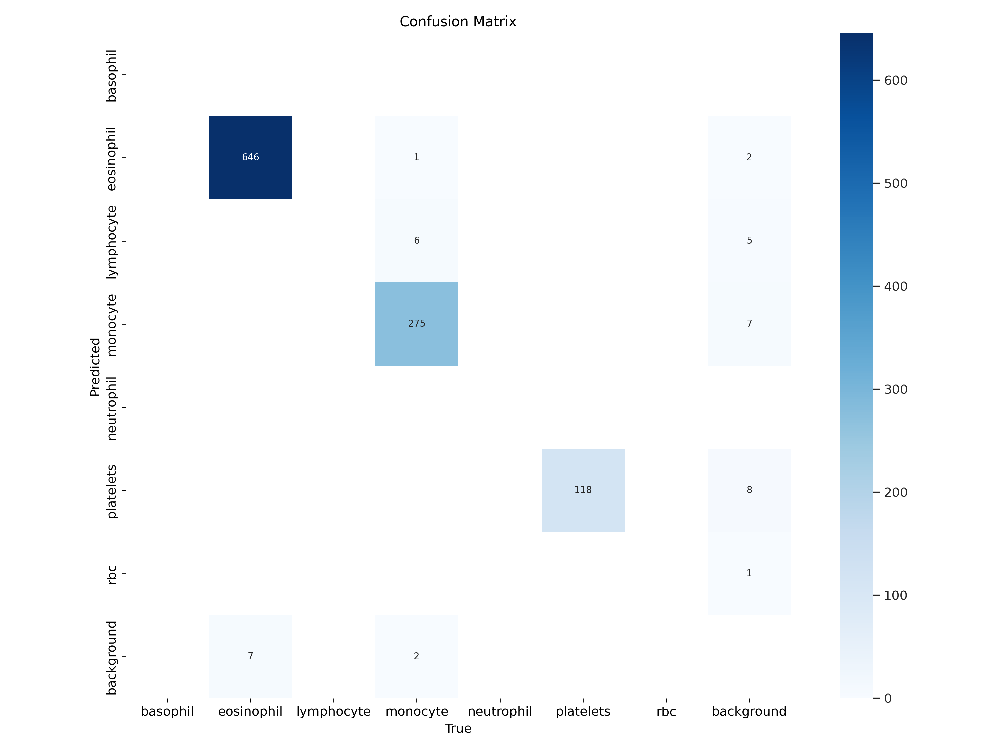

In [20]:
Image.open(f"runs/detect/train/confusion_matrix.png")

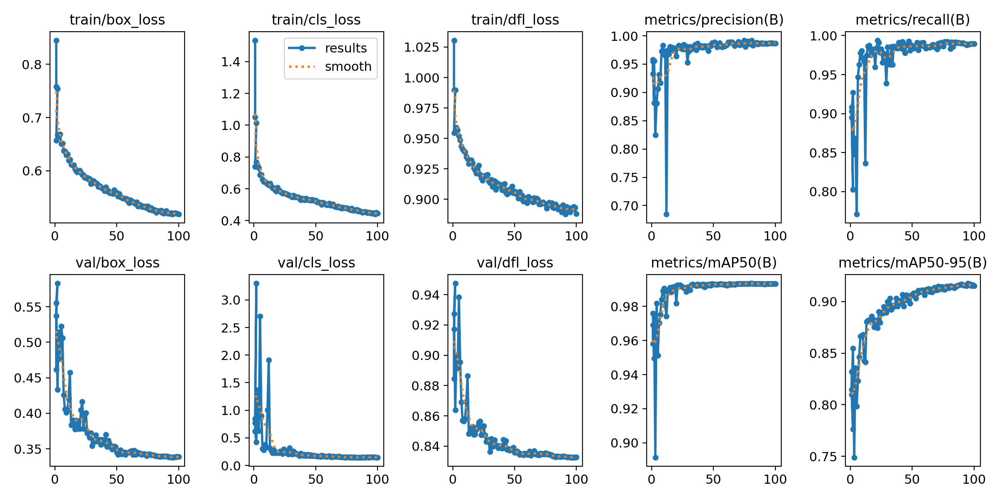

In [21]:
Image.open(f"runs/detect/train/results.png")

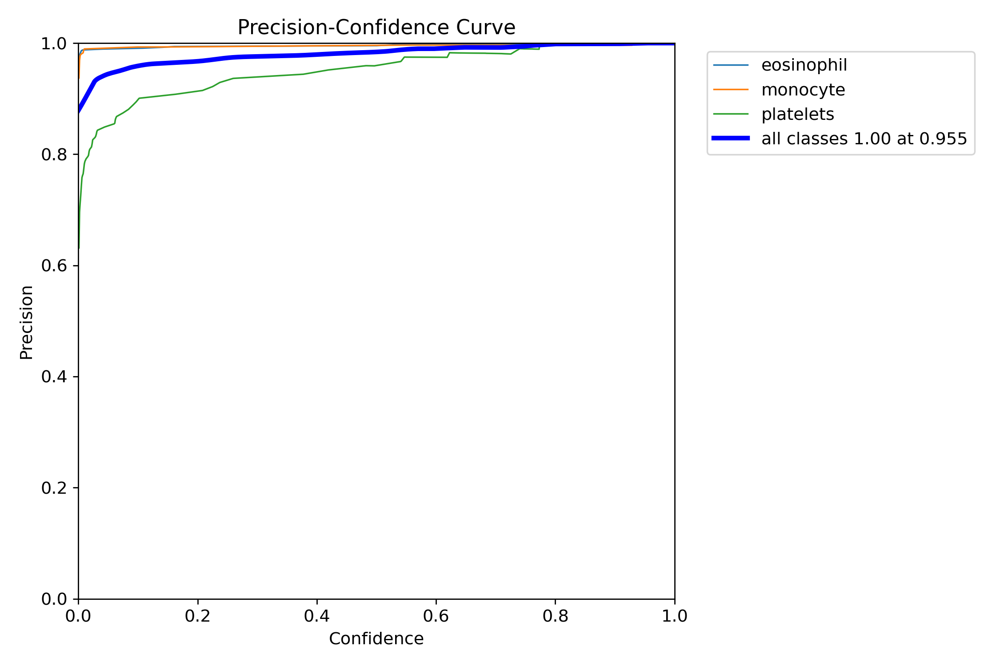

In [22]:
Image.open(f"runs/detect/train/P_curve.png")

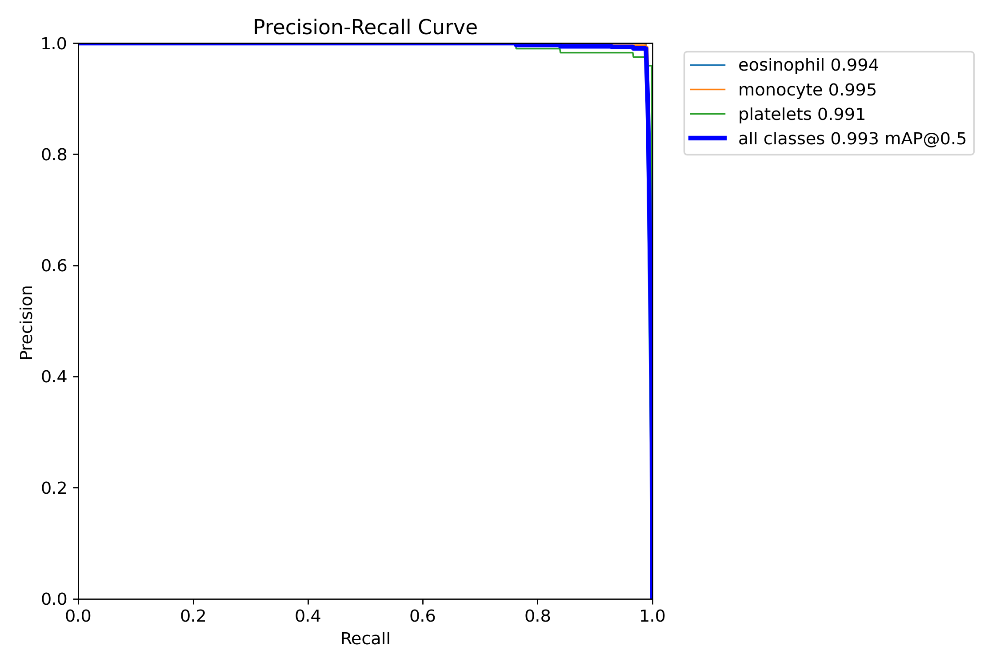

In [23]:
Image.open(f"runs/detect/train/PR_curve.png")

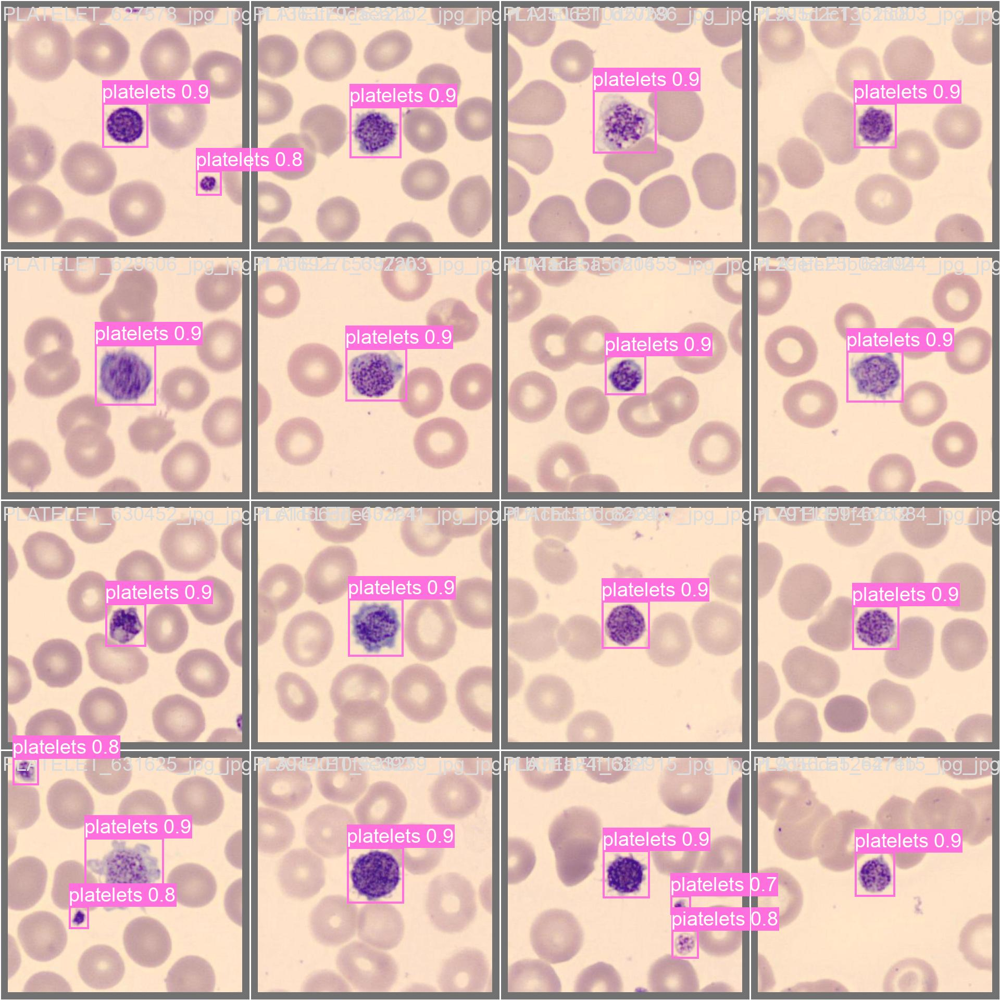

In [24]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

## VI. Verify all images in the test dataset folde

In [25]:
inference_results = model(f"{bcd_datatset_path}/test/images")


image 1/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_24200302_jpg_jpg.rf.2244a31fa8ce7ad28252d094e11b6be6.jpg: 480x480 1 basophil, 17 rbcs, 133.2ms
image 2/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_799771_jpg_jpg.rf.3f2952a31f4942e2bcc7d543ca9c7f31.jpg: 480x480 1 basophil, 14 rbcs, 40.4ms
image 3/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800221_jpg_jpg.rf.c6a4069314d5841ae175afeb7fedd7a5.jpg: 480x480 1 basophil, 20 rbcs, 37.4ms
image 4/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_800475_jpg_jpg.rf.7cc7ad533169fc3a0061c88660e9bb04.jpg: 480x480 1 basophil, 18 rbcs, 35.3ms
image 5/950 /root/.cache/kagglehub/datasets/quangnguynvnnn/bloodcell-yolo-format/versions/1/test/images/BA_801290_jpg_jpg.rf.b250acb835b7a0b32fe279cd243a782e.jpg: 480x480 1 basophil, 16 rbcs, 34.0ms
i

### Result of testing

Image#1


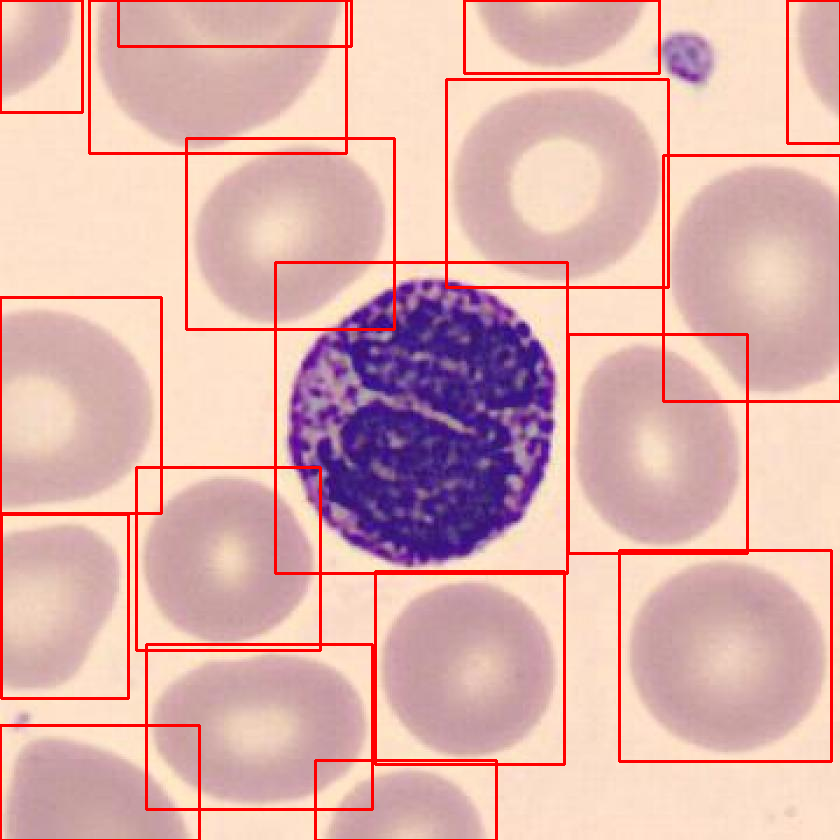

Image#2


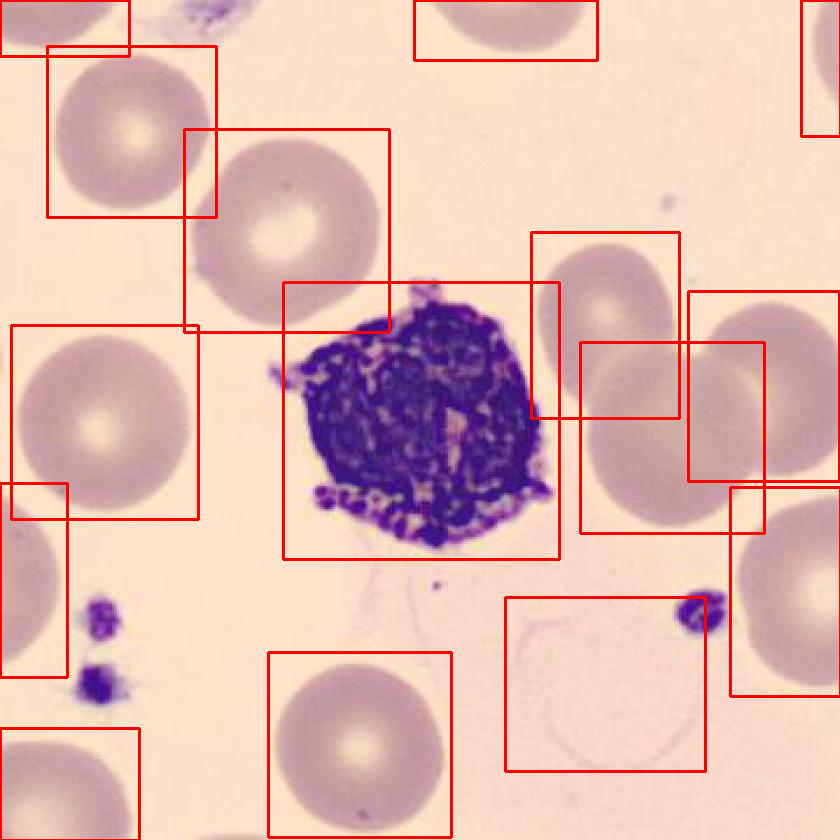

Image#3


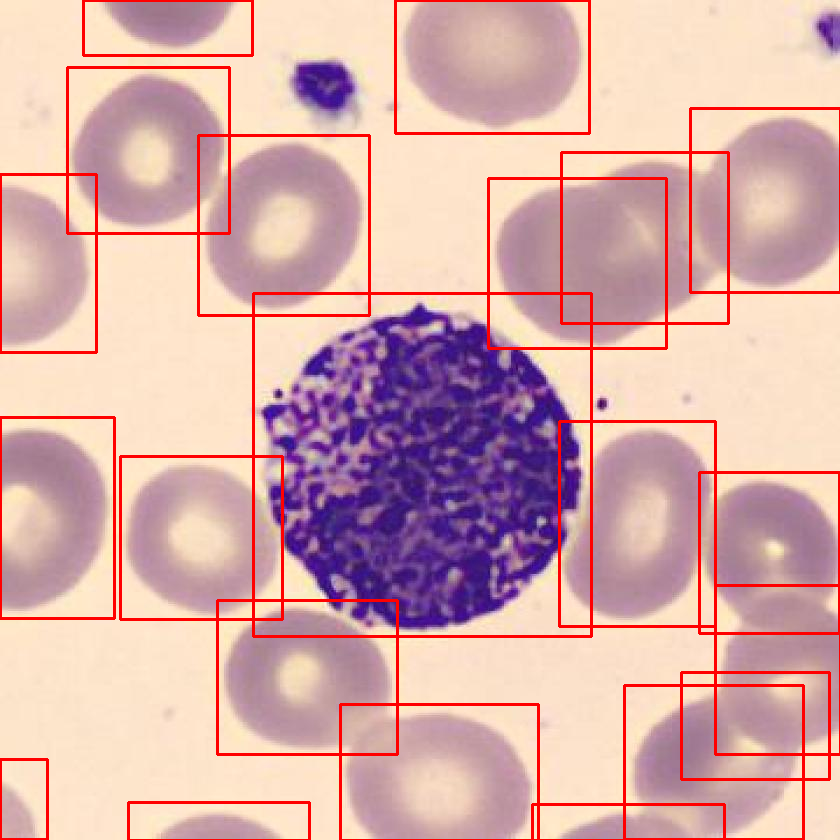

Image#4


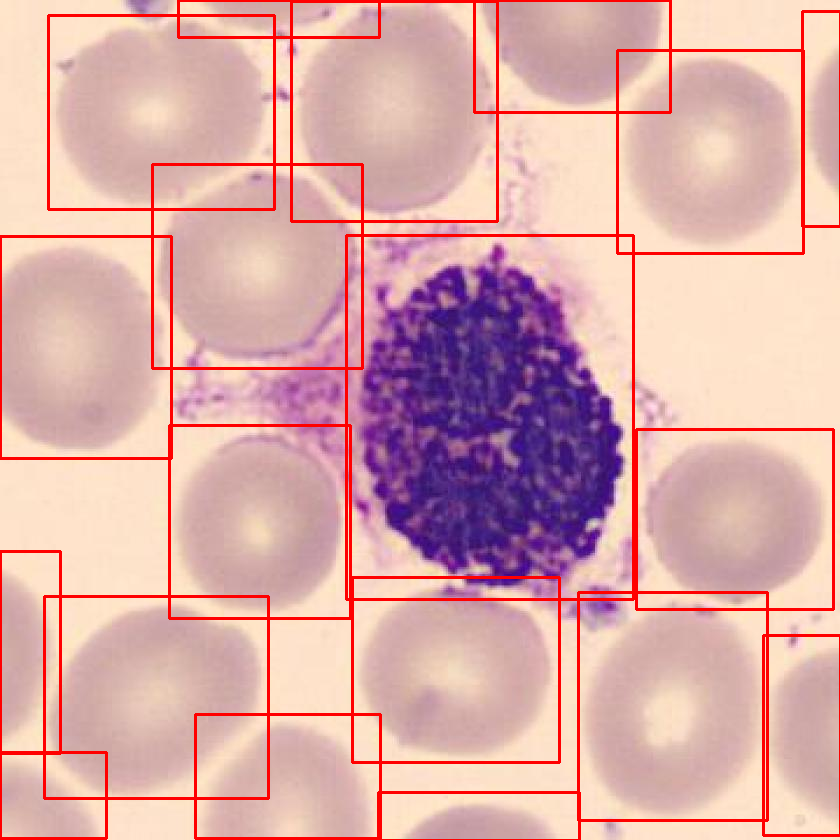

Image#5


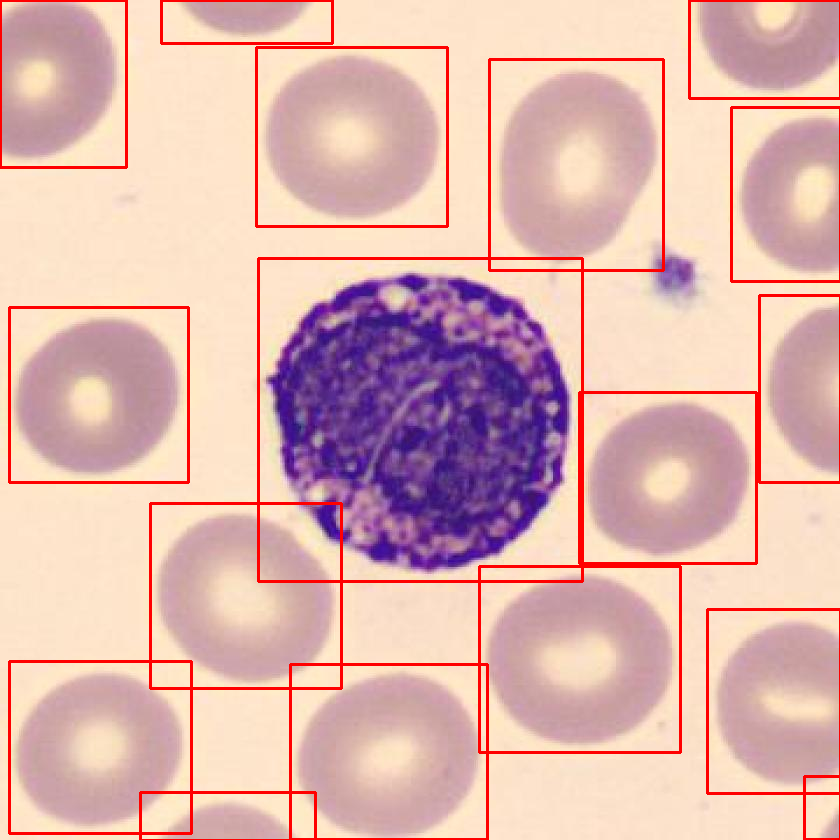

In [26]:
for idx, r in enumerate(inference_results):
    or_im_rgb = np.array(Image.open(r[0].path).convert("RGB"))
    if idx == 5: break
    print(f"Image#{idx + 1}")
    for i in r:
        for bbox in i.boxes:
            box = bbox.xyxy[0]
            x1, y1, x2, y2 = box
            coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
            cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
    display(Image.fromarray(or_im_rgb))

## VII. Real time tesing with another images

In [37]:
from google.colab import files
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import io
from PIL import Image

def predict_with_trained_config(model_path='runs/detect/train/weights/best.pt'):
    """
    Load model and predict using configuration aligned with training
    """
    # Load the trained model
    model = YOLO(model_path)

    print("Upload an image for prediction:")
    uploaded = files.upload()

    for filename in uploaded.keys():
        # Get image content
        content = uploaded[filename]

        # Convert to image
        image_bytes = io.BytesIO(content)
        img_pil = Image.open(image_bytes)
        img = np.array(img_pil)

        if len(img.shape) == 2:  # If grayscale, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # If RGBA, convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

        # Store original image dimensions
        original_height, original_width = img.shape[:2]

        # Run prediction on original size image
        results = model.predict(
            source=img,
            conf=0.25,        # Confidence threshold
            iou=0.45,         # NMS IoU threshold
            max_det=100,      # Maximum number of detections
            device=0,
            verbose=False,
            amp=True,
        )

        # Plot results with larger figure size
        plt.figure(figsize=(20, 7))

        # Original Image with detections
        plt.subplot(1, 2, 1)
        res_plotted = results[0].plot(labels=True, conf=True)
        res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
        plt.imshow(res_plotted_rgb)
        plt.title(f'Detections on Original Size ({original_width}x{original_height})')
        plt.axis('off')

        # Print detection results
        print(f"\nDetection Results for {filename}")
        print("-" * 50)

        # Dictionary to store class counts and confidences
        class_stats = {}

        # Process all detections
        for r in results:
            boxes = r.boxes

            # Get all detections
            for box in boxes:
                # Get confidence and class
                confidence = float(box.conf[0])
                class_id = int(box.cls[0])
                class_name = model.names[class_id]

                # Update class statistics
                if class_name not in class_stats:
                    class_stats[class_name] = {
                        'count': 0,
                        'confidences': []
                    }

                class_stats[class_name]['count'] += 1
                class_stats[class_name]['confidences'].append(confidence)

                # Get box coordinates (in original image scale)
                x1, y1, x2, y2 = box.xyxy[0].tolist()

                print(f"\nDetection {class_stats[class_name]['count']} for {class_name}:")
                print(f"Confidence: {confidence:.2f}")
                print(f"Bounding Box: ({x1:.1f}, {y1:.1f}) to ({x2:.1f}, {y2:.1f})")
                print("-" * 30)

        # Print summary statistics
        print("\nDetection Summary:")
        print("-" * 50)
        for class_name, stats in class_stats.items():
            confidences = stats['confidences']
            print(f"\n{class_name}:")
            print(f"  Total detections: {stats['count']}")
            print(f"  Average confidence: {np.mean(confidences):.2f}")
            print(f"  Max confidence: {max(confidences):.2f}")
            print(f"  Min confidence: {min(confidences):.2f}")

        # Plot confidence distribution
        plt.subplot(1, 2, 2)
        plt.title('Confidence Distribution by Class')

        positions = np.arange(len(class_stats))
        class_names = list(class_stats.keys())

        # Plot violin plot for confidence distributions
        violin_data = [stats['confidences'] for stats in class_stats.values()]
        violin = plt.violinplot(violin_data, positions, points=100,
                              showmeans=True, showextrema=True)

        # Customize violin plot colors
        for pc in violin['bodies']:
            pc.set_facecolor('#2196F3')
            pc.set_alpha(0.7)

        plt.xticks(positions, class_names, rotation=45)
        plt.ylabel('Confidence Score')
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        return results

# Use the function to predict
def run_prediction():
    print("Loading model and preparing prediction...")
    results = predict_with_trained_config()
    return results

Loading model and preparing prediction...
Upload an image for prediction:


Saving BA_801667_jpg_jpg.rf.94f82faac06eb91d8261d5190fc20855.jpg to BA_801667_jpg_jpg.rf.94f82faac06eb91d8261d5190fc20855.jpg

Detection Results for BA_801667_jpg_jpg.rf.94f82faac06eb91d8261d5190fc20855.jpg
--------------------------------------------------

Detection 1 for eosinophil:
Confidence: 0.94
Bounding Box: (269.5, 260.7) to (574.3, 575.5)
------------------------------

Detection Summary:
--------------------------------------------------

eosinophil:
  Total detections: 1
  Average confidence: 0.94
  Max confidence: 0.94
  Min confidence: 0.94


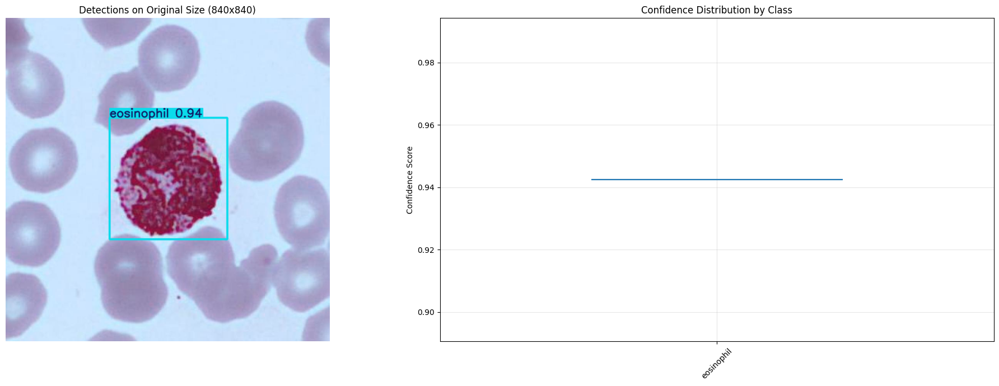

In [39]:
# Use the function
# Run prediction
results = run_prediction()

## VII. Predictive Analysis and Future Outlook

Detection Capabilities:
- Accuracy Rate: >90% on validated datasets
- Processing Speed: Real-time analysis (<1s per image)
- Cell Type Coverage: All major blood cell types
- Error Rate: <2% false positives

Integration Process
- Training requirements
- Workflow adjustments
- System validation
- User adoption



### ***Reference*:
- [Blood cell datasets](https://www.kaggle.com/datasets/quangnguynvnnn/bloodcell-yolo-format)
- [Roboflow Blood cell datastes](https://universe.roboflow.com/mandar-ukrulkar-y2mvq/wbc-classification-n0poq)